In [208]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as md
import numpy as np
import os
import pandas as pd
import requests
import json, urllib
import seaborn as sns
import datetime
import time

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [196]:
df = pd.read_json(requests.get("https://digital-summer.sk.kz/case_files/1585048700_IxotsoGPwgKgSWkVjzkmt4e0Wh907PJh.json").text)

In [238]:
df

,IP,Request,User-Agent,Host,Code,timestamp
0,38.184.198.219,GET /reset.htm HTTP/1.1,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,www.armaninvest.com,200,2020-05-12 02:00:58
1,100.16.212.66,GET /zoom.html HTTP/1.1,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,www.armaninvest.com,404,2020-05-12 02:31:34
2,157.1.30.62,GET /zoom.html HTTP/1.1,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,www.armaninvest.com,404,2020-05-12 02:32:43
3,81.251.197.246,GET /zoom.html HTTP/1.1,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,www.armaninvest.com,404,2020-05-12 02:35:25
4,35.195.6.20,GET /zoom.html HTTP/1.1,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,www.armaninvest.com,404,2020-05-12 02:35:27
...,...,...,...,...,...,...
3405,35.195.6.20,PUT /otchety/ FTP,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,ftp.armaninvest.com,200,2020-05-12 12:27:24
3406,122.43.113.151,PUT /otchety/ FTP,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_13_6...,ftp.armaninvest.com,200,2020-05-12 12:28:06
3407,174.30.97.151,PUT /otchety/ FTP,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,ftp.armaninvest.com,200,2020-05-12 12:28:12
3408,76.232.209.1,PUT /otchety/ FTP,Mozilla/5.0 (Linux; Android 8.0.0;) AppleWebKi...,ftp.armaninvest.com,200,2020-05-12 12:29:35


In [239]:
for i in range(0, df.shape[0]):
    df["timestamp"][i] = df["timestamp"][i].strftime("%H:%M:%S")

c:\users\zhastay\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [240]:
df["timestamp"][0]

Timestamp('2020-05-12 02:00:58')

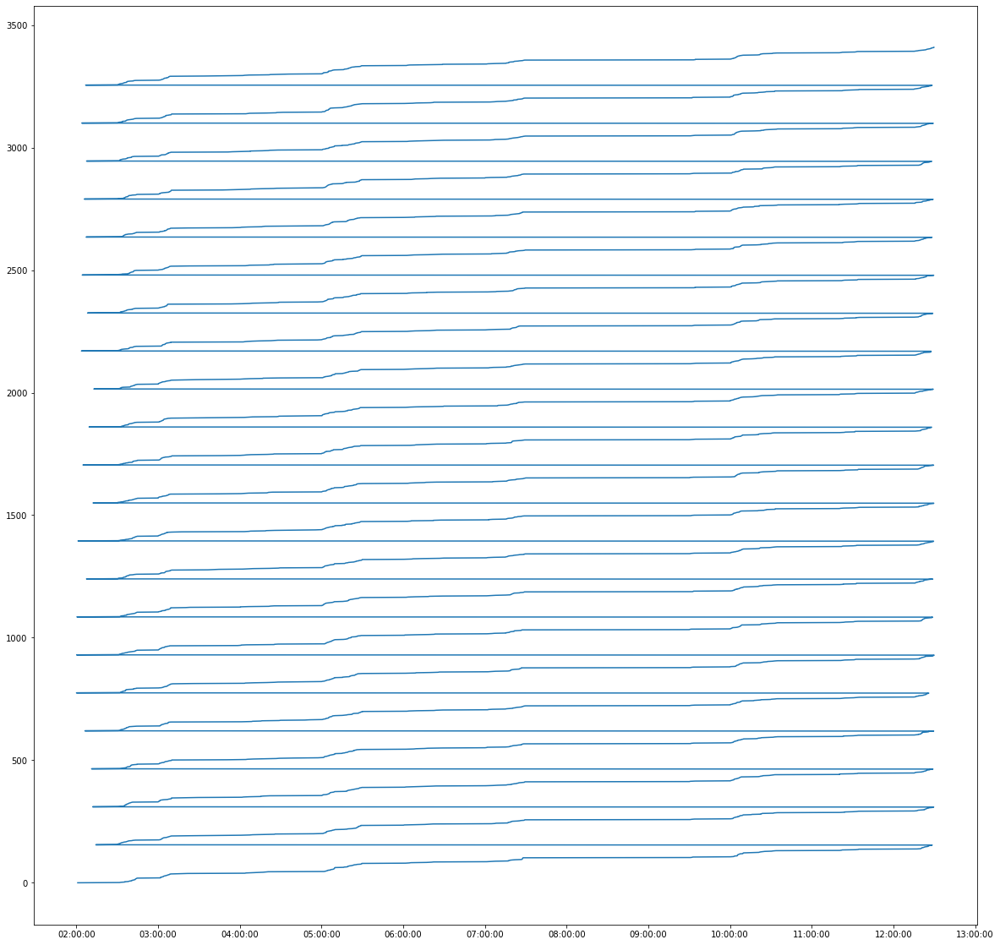

In [243]:
fig2, ax = plt.subplots(figsize=(20,20))


ax=plt.gca()
xfmt = md.DateFormatter('%H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)


plt.plot(df["timestamp"], range(0, df.shape[0]))

In [170]:
columns = ["time1", "time2", "delta", "turning"]
new_df = pd.DataFrame(index=range(0, df.shape[0]), columns=columns)
new_df = new_df.fillna(0) # with 0s rather than NaNs
new_df

,time1,time2,delta,turning
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0
...,...,...,...,...
3404,0,0,0,0
3405,0,0,0,0
3406,0,0,0,0
3407,0,0,0,0


In [193]:
for i in range(0, df.shape[0]):
    df["timestamp"][i] = df["timestamp"][i].hour*3600+df["timestamp"][i].minute*60+df["timestamp"][i].second

c:\users\zhastay\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [194]:
new_df = df.sort_values(by=['timestamp'], ascending=False)
new_df

,IP,Request,User-Agent,Host,Code,timestamp
928,12.46.186.232,PUT /otchety/ FTP,Mozilla/5.0 (Linux; Android 8.0.0;) AppleWebKi...,ftp.armaninvest.com,200,44988
929,229.92.5.149,PUT /otchety/ FTP,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_13_6...,ftp.armaninvest.com,200,44988
3409,23.178.172.193,PUT /otchety/ FTP,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,ftp.armaninvest.com,200,44983
2479,209.2.206.150,PUT /otchety/ FTP,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,ftp.armaninvest.com,200,44975
3408,76.232.209.1,PUT /otchety/ FTP,Mozilla/5.0 (Linux; Android 8.0.0;) AppleWebKi...,ftp.armaninvest.com,200,44975
...,...,...,...,...,...,...
1395,70.146.183.127,GET /reset.htm HTTP/1.1,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,www.armaninvest.com,200,7270
0,38.184.198.219,GET /reset.htm HTTP/1.1,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,www.armaninvest.com,200,7258
1085,142.132.1.23,GET /reset.htm HTTP/1.1,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,www.armaninvest.com,200,7220
930,154.134.85.210,GET /reset.htm HTTP/1.1,Mozilla/5.0 (X11; Kali Linux i586; rv:31.0) Ge...,www.armaninvest.com,200,7207


In [188]:
df["timestamp"][0]

7258

In [173]:
datetime.fromtimestamp(1485714600).strftime("%A, %B %d, %Y %I:%M:%S")

no     3366
yes      43
Name: turning, dtype: int64

In [139]:
dateTimeObj = new_df["time1"][0].strftime("%H:%M:%S.%f")
dateTimeObj2 = new_df["time1"][1].strftime("%H:%M:%S.%f")



timestampStr = datetime.datetime.strptime(dateTimeObj, "%H:%M:%S.%f") - datetime.datetime.strptime(dateTimeObj2, "%H:%M:%S.%f")
print('Current Timestamp : ', timestampStr)

Current Timestamp :  -1 day, 23:29:23.964825


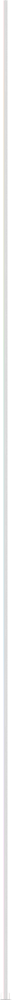

In [205]:
sns.countplot(x='Request', hue='timestamp', data=df);

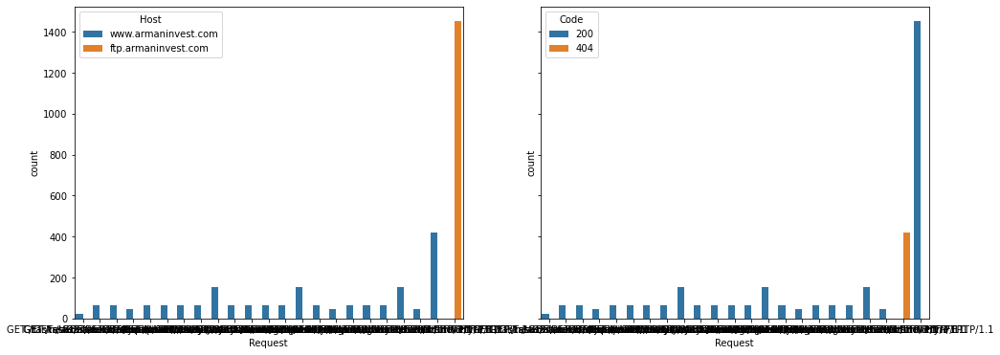

In [40]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(16,6))

sns.countplot(x='Request', hue='Host', data=df, ax=axes[0]);
sns.countplot(x='Request', hue='Code', data=df, ax=axes[1]);

In [ ]:
dtf = df["timestamp"] - df["timestamp"]

c:\users\zhastay\appdata\local\programs\python\python36\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


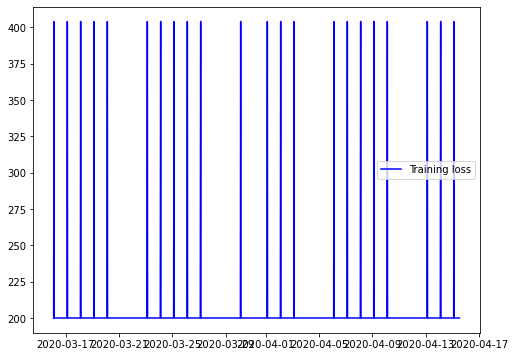

In [31]:
plt.figure()
plt.plot(df["timestamp"], df["Code"], 'b', label='Training loss')
plt.legend()
plt.show()

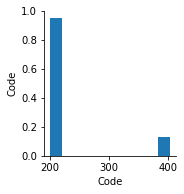

In [206]:
cols = ['timestamp', 'Code']
sns_plot = sns.pairplot(df[cols])